In [1]:
!pip install optuna swifter

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 379.9/379.9 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 12.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 5.3 MB/s eta 0:00:00
  Created wheel for swifter: filename=swifter-1.4.0-py3-none-any.whl size=16507 sha256=67c7b1942c72347e95fd93cd92d2f367b4cfadb5e2f189eaf16a84e13d10cef4
  Stored in directory: /root/.cache/pip/wheels/e4/cf/51/0904952972ee2c7aa3709437065278dc534ec1b8d2ad41b443
Successfully built swifter


In [2]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import optuna
from sklearn.model_selection import learning_curve
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, recall_score, classification_report
from gensim.models import Word2Vec
from sklearn.metrics.pairwise import cosine_similarity
import swifter
import re
from sklearn.model_selection import cross_val_score
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
import random
import string
from wordcloud import WordCloud

EDA

In [3]:
books_df = pd.read_csv('/content/Books.csv')
print("Books DataFrame:")
books_df.head()

Books DataFrame:


,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [4]:
ratings_df = pd.read_csv('/content/Ratings.csv')
print("Ratings DataFrame:")
ratings_df.head()

Ratings DataFrame:


,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [5]:
users_df = pd.read_csv('/content/Users.csv')
print("Users DataFrame:")
users_df.head()

Users DataFrame:


,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


Merger Data

In [6]:
merged_df = pd.merge(books_df, ratings_df, on='ISBN')
final_df = pd.merge(merged_df, users_df, on='User-ID')
# Print the combined dataframe
final_df.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L,User-ID,Book-Rating,Location,Age
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,2,0,"stockton, california, usa",18.0
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,8,5,"timmins, ontario, canada",NaN
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,8,0,"timmins, ontario, canada",NaN
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,8,0,"timmins, ontario, canada",NaN
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,8,0,"timmins, ontario, canada",NaN


In [7]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 824520 entries, 0 to 824519
Data columns (total 12 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ISBN                 824520 non-null  object 
 1   Book-Title           824520 non-null  object 
 2   Book-Author          824520 non-null  object 
 3   Year-Of-Publication  824520 non-null  int64  
 4   Publisher            824518 non-null  object 
 5   Image-URL-S          824519 non-null  object 
 6   Image-URL-M          824519 non-null  object 
 7   Image-URL-L          824519 non-null  object 
 8   User-ID              824520 non-null  int64  
 9   Book-Rating          824520 non-null  int64  
 10  Location             824520 non-null  object 
 11  Age                  601467 non-null  float64
dtypes: float64(1), int64(3), object(8)
memory usage: 81.8+ MB


In [8]:
final_df.shape

(824520, 12)

Visualize Data

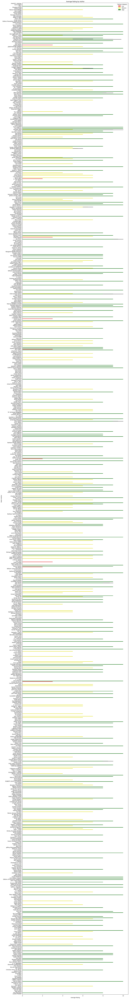

In [9]:
sample_size = 1000
sample_df = final_df.sample(n=sample_size, random_state=42)
# Variable rating
sample_df['Rating_Category'] = pd.cut(sample_df['Book-Rating'], bins=[0, 3, 7, 10], labels=['Low', 'Medium', 'High'])
# Barplot using seaborn
plt.figure(figsize=(16, 150))
sns.barplot(data=sample_df, x='Book-Rating', y='Book-Author', hue='Rating_Category', palette={'Low': 'red', 'Medium': 'yellow', 'High': 'green'})
plt.title('Average Rating by Author')
plt.xlabel('Average Rating')
plt.ylabel('Book Author')
plt.legend(title='Rating Category')
plt.show()

By Book Title

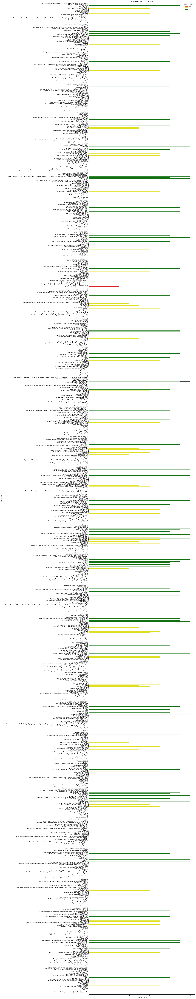

In [10]:
sample_size = 1000
sample_df = final_df.sample(n=sample_size, random_state=42)
# Variable rating
sample_df['Rating_Category'] = pd.cut(sample_df['Book-Rating'], bins=[0, 3, 7, 10], labels=['Low', 'Medium', 'High'])
# Plotting bar plot dengan seaborn
plt.figure(figsize=(16, 150))
sns.barplot(data=sample_df, x='Book-Rating', y='Book-Title', hue='Rating_Category', palette={'Low': 'red', 'Medium': 'yellow', 'High': 'green'})
plt.title('Average Rating by Title of Book')
plt.xlabel('Average Rating')
plt.ylabel('Title of Book')
plt.legend(title='Rating Category')
plt.show()

Growth of readers or book buyers from year to year

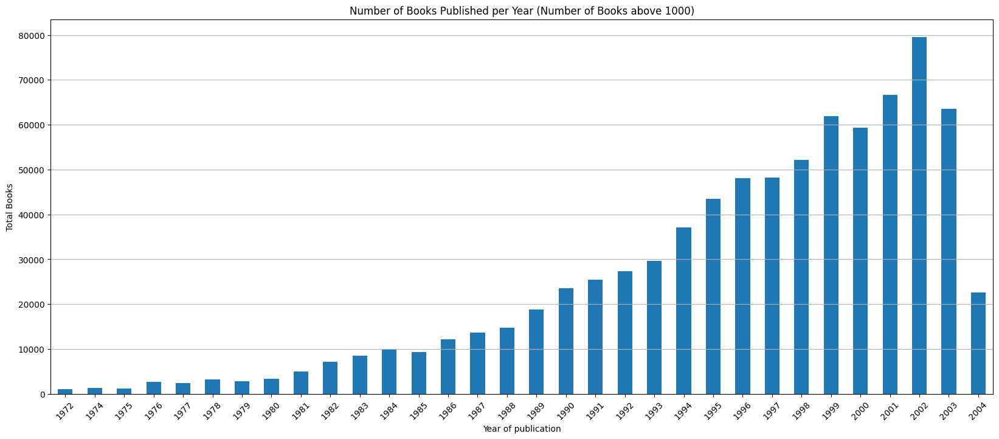

In [11]:
# Change NaN value to 0
final_df['Year-Of-Publication'] = pd.to_numeric(final_df['Year-Of-Publication'], errors='coerce').fillna(0)
# Set Data type of Year-Of-Publication to Integer
final_df['Year-Of-Publication'] = final_df['Year-Of-Publication'].astype(int)
# Filter valid publication years (greater than 0)
valid_years = final_df[final_df['Year-Of-Publication'] > 0]['Year-Of-Publication']
# Count total books per year
books_per_year_filtered = valid_years.value_counts()
# Filter the number of books published above 1000
books_per_year_filtered = books_per_year_filtered[books_per_year_filtered > 1000]
# Sort data based on year of publication from the previous year
books_per_year_filtered = books_per_year_filtered.sort_index(ascending=True)
# Bar plot
plt.figure(figsize=(20, 8))
books_per_year_filtered.plot(kind='bar')
plt.title('Number of Books Published per Year (Number of Books above 1000)')
plt.xlabel('Year of publication')
plt.ylabel('Total Books')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

Data Preprocessing

In [12]:
columns = final_df.columns.tolist()
columns

['ISBN',
 'Book-Title',
 'Book-Author',
 'Year-Of-Publication',
 'Publisher',
 'Image-URL-S',
 'Image-URL-M',
 'Image-URL-L',
 'User-ID',
 'Book-Rating',
 'Location',
 'Age']

Check Missing Value

In [13]:
missing_values = final_df.isnull().sum()
missing_values

ISBN                        0
Book-Title                  0
Book-Author                 0
Year-Of-Publication         0
Publisher                   2
Image-URL-S                 1
Image-URL-M                 1
Image-URL-L                 1
User-ID                     0
Book-Rating                 0
Location                    0
Age                    223053
dtype: int64

Handling Missing Value

In [14]:
# Handle missing values in 'Book-Author' and 'Publisher' columns with mode
final_df['Book-Author'].fillna(final_df['Book-Author'].mode()[0], inplace=True)
final_df['Publisher'].fillna(final_df['Publisher'].mode()[0], inplace=True)
# Drop 'Image-URL-L' & 'Location' column if not needed
final_df.drop(columns=['Image-URL-L', 'Location'], inplace=True)
# Handle missing values in 'Age' column with median
final_df['Age'].fillna(final_df['Age'].median(), inplace=True)

In [15]:
missing_values = final_df.isnull().sum()
missing_values

ISBN                   0
Book-Title             0
Book-Author            0
Year-Of-Publication    0
Publisher              0
Image-URL-S            1
Image-URL-M            1
User-ID                0
Book-Rating            0
Age                    0
dtype: int64

In [16]:
# Change data type of numeric
final_df['Age'] = final_df['Age'].astype(int)
final_df['Book-Rating'] = final_df['Book-Rating'].astype(int)
final_df['User-ID'] = final_df['User-ID'].astype(int)
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 824520 entries, 0 to 824519
Data columns (total 10 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 824520 non-null  object
 1   Book-Title           824520 non-null  object
 2   Book-Author          824520 non-null  object
 3   Year-Of-Publication  824520 non-null  int64 
 4   Publisher            824520 non-null  object
 5   Image-URL-S          824519 non-null  object
 6   Image-URL-M          824519 non-null  object
 7   User-ID              824520 non-null  int64 
 8   Book-Rating          824520 non-null  int64 
 9   Age                  824520 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 69.2+ MB


In [17]:
duplicate_count = final_df.duplicated().sum()
duplicate_count

0

Remove Book with Rating 0

In [18]:
final_df = final_df[final_df['Book-Rating'] != 0]

In [19]:
# Check book with rating 0
zero_rating_books_df = final_df[final_df['Book-Rating'] == 0]
zero_rating_books_df

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,User-ID,Book-Rating,Age


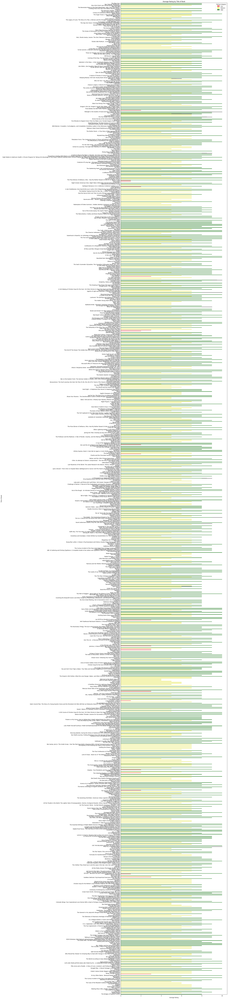

In [20]:
sample_size = 1000
sample_df = final_df.sample(n=sample_size, random_state=42)
# Variable rating
sample_df['Rating_Category'] = pd.cut(sample_df['Book-Rating'], bins=[0, 3, 7, 10], labels=['Low', 'Medium', 'High'])
# Plotting bar plot dengan seaborn
plt.figure(figsize=(16, 150))
sns.barplot(data=sample_df, x='Book-Rating', y='Book-Title', hue='Rating_Category', palette={'Low': 'red', 'Medium': 'yellow', 'High': 'green'})
plt.title('Average Rating by Title of Book')
plt.xlabel('Average Rating')
plt.ylabel('Title of Book')
plt.legend(title='Rating Category')
plt.show()

In [21]:
final_df.describe()

,Year-Of-Publication,User-ID,Book-Rating,Age
count,310241.000000,310241.000000,310241.000000,310241.000000
mean,1967.419687,130870.876554,7.656822,36.331394
std,237.521244,83284.074741,1.821917,11.632662
min,0.000000,8.000000,1.000000,0.000000
25%,1993.000000,55490.000000,7.000000,31.000000
50%,1998.000000,124688.000000,8.000000,35.000000
75%,2001.000000,204482.000000,9.000000,40.000000
max,2050.000000,278854.000000,10.000000,244.000000


Handling Outlier

In [22]:
# Handle outlier for Age
age_q1 = final_df['Age'].quantile(0.25)
age_q3 = final_df['Age'].quantile(0.75)
age_iqr = age_q3 - age_q1
age_lower_bound = age_q1 - 1.5 * age_iqr
age_upper_bound = age_q3 + 1.5 * age_iqr
final_df = final_df[(final_df['Age'] >= age_lower_bound) & (final_df['Age'] <= age_upper_bound)] # Remove rows that have 'Age' values ​​outside the range [age_lower_bound, age_upper_bound]

# Handle outlier for Year-Of-Publication
year_q1 = final_df['Year-Of-Publication'].quantile(0.25)
year_q3 = final_df['Year-Of-Publication'].quantile(0.75)
year_iqr = year_q3 - year_q1
year_lower_bound = year_q1 - 1.5 * year_iqr
year_upper_bound = year_q3 + 1.5 * year_iqr
final_df = final_df[(final_df['Year-Of-Publication'] >= year_lower_bound) & (final_df['Year-Of-Publication'] <= year_upper_bound)] # Removes rows that have 'Year-Of-Publication' values ​​outside the range [year_lower_bound, year_upper_bound]

final_df.describe()

,Year-Of-Publication,User-ID,Book-Rating,Age
count,268362.000000,268362.000000,268362.000000,268362.000000
mean,1996.835994,130648.479367,7.637262,35.014410
std,5.377677,83149.429871,1.821434,7.582385
min,1981.000000,8.000000,1.000000,18.000000
25%,1994.000000,55244.750000,7.000000,31.000000
50%,1998.000000,124732.000000,8.000000,35.000000
75%,2001.000000,203764.000000,9.000000,37.000000
max,2005.000000,278854.000000,10.000000,53.000000


Now the data looks more reasonable

In [23]:
pd.set_option('display.max_colwidth', None)
title_sample = final_df[['ISBN', 'Book-Title']].sample(20) # let's see sample title of book
print(title_sample.to_string(index=False))

      ISBN                                                                                    Book-Title
0671535951                                                                      Clean House Clean Planet
0553803077                                      Sickened : The Memoir of a Munchausen by Proxy Childhood
0671793489                                                                           All Around the Town
037303783X                                                  Part - Time Fiance (Harlequin Romance, 3783)
0061031070                                                                                 Moving Target
0312280661                                           Proof of Intent: A Charley Sloan Courtroom Thriller
0380718340                                     Cruel &amp; Unusual (Kay Scarpetta Mysteries (Paperback))
0802139892                                                                            Wish You Were Here
0553213423                                             

Word2Vec model

The genre prediction process is carried out after the vector representation of book titles is generated. In this script, genre prediction is carried out by looking for similarities between the vector representation of the book title and the vector representation for each previously determined genre. The genre most similar to the vector representation of book titles, based on cosine similarity, is selected as the genre predictor.

It is worth noting that the trained Word2Vec model only learns patterns from the text given during training. So, if a book title is in multiple languages ​​such as English, Spanish, French, Turkish, Russian, or any other language, the Word2Vec model will learn the word patterns in that language and generate a vector representation based on those patterns. Then, genre prediction is carried out based on the resulting vector representation, without paying attention to the original language of the book title. Therefore, this model does not explicitly consider language when making genre predictions.

In [24]:
# Define genres and corresponding labels
genres = ['Fiction', 'Novel', 'Adventure', 'Romance', 'History', 'Thriller', 'Horror', 'Biography', 'Fantasy', 'Other']

Train Model

In [25]:
sentences = [title.split() for title in final_df['Book-Title']]
# Train the Word2Vec model
model = Word2Vec(sentences, vector_size=500, window=5, min_count=5, sg=2)

Labeling Function

In [26]:
# Define function to clean text
def clean_text(text):
    # Removes special characters and numbers
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    # Convert to lowercase
    text = text.lower()
    return text

# Define function to predict genre from book title
def predict_genre(book_title):
    clean_title = clean_text(book_title)
    title_words = clean_title.split()

    # Check if title_words is empty
    if not title_words:
        return 'Other'
    # Filter title words that are present in the Word2Vec model vocabulary
    title_words = [word for word in title_words if word in model.wv]

    # Check if there are words left after filtering
    if not title_words:
        return 'Other'

    # Get the average word vector for the title
    title_vector = sum([model.wv[word] for word in title_words]) / len(title_words)

    # Find the most similar genre based on cosine similarity
    most_similar_genre = None # Initial genre
    max_similarity = -1
    for genre in genres:
        genre_vector = model.wv[genre]
        similarity = cosine_similarity([title_vector], [genre_vector])[0][0] # cosine_similarity : search for similarities between two vectors in multidimensional
        if similarity > max_similarity:
            max_similarity = similarity
            most_similar_genre = genre

    return most_similar_genre

In [27]:
# Testing
book_title_to_predict = "Wie man einen Mann aufreisst (Heyne BÃ¼cher)"
predicted_genre = predict_genre(book_title_to_predict) # Genre predict of the book

print(f"The predicted genre for '{book_title_to_predict}' is {predicted_genre}.")

The predicted genre for 'Wie man einen Mann aufreisst (Heyne BÃ¼cher)' is Thriller.


In [28]:
# Applied function using swifter
final_df['Genre'] = final_df['Book-Title'].swifter.apply(predict_genre)

Pandas Apply:   0%|          | 0/268362 [00:00<?, ?it/s]

In [29]:
final_df.sample(10)

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,User-ID,Book-Rating,Age,Genre
716047,0399148027,Blue Diary,Alice Hoffman,2001,G. P. Putnam's Sons,http://images.amazon.com/images/P/0399148027.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0399148027.01.MZZZZZZZ.jpg,216225,8,35,Thriller
152279,0967307902,Marley's Ghost,Mark H. Osmun,2000,Twelfth Night Press,http://images.amazon.com/images/P/0967307902.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0967307902.01.MZZZZZZZ.jpg,2766,8,42,Other
419738,0375412824,The Dive From Clausen's Pier (Alex Awards),ANN PACKER,2002,Knopf,http://images.amazon.com/images/P/0375412824.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0375412824.01.MZZZZZZZ.jpg,143415,9,50,Horror
145313,0064471861,Parrot in the Oven (rpkg) : mi vida,Victor Martinez,1998,Rayo,http://images.amazon.com/images/P/0064471861.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0064471861.01.MZZZZZZZ.jpg,269799,6,35,History
615850,0312190344,The Year's Best Fantasy and Horror (11th Annual Collection) (Paper),Ellen Datlow,1998,St. Martin's Griffin,http://images.amazon.com/images/P/0312190344.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0312190344.01.MZZZZZZZ.jpg,21406,7,35,Horror
335577,0451203895,4 Blondes,Candace Bushnell,2002,Signet Book,http://images.amazon.com/images/P/0451203895.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0451203895.01.MZZZZZZZ.jpg,249848,9,35,Other
333113,0312963157,The Last Girl (Last Girl),Penelope Evans,1997,St. Martin's Press,http://images.amazon.com/images/P/0312963157.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0312963157.01.MZZZZZZZ.jpg,264082,2,42,Horror
399578,1551668777,So Wild A Heart,Candace Camp,2002,Mira,http://images.amazon.com/images/P/1551668777.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/1551668777.01.MZZZZZZZ.jpg,98391,8,52,Thriller
798796,0965611833,"All Slots Made Easier (Winning Strategies for Basic Slots, Progressives &amp; Newest Versions)",Gayle Mitchell,1999,Webster Research/Info Services Group,http://images.amazon.com/images/P/0965611833.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0965611833.01.MZZZZZZZ.jpg,16468,8,35,Other
611392,0811828964,The Bad Girl's Guide to Getting What You Want,Cameron Tuttle,2000,Chronicle Books,http://images.amazon.com/images/P/0811828964.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0811828964.01.MZZZZZZZ.jpg,160295,8,38,History


In [30]:
final_df.shape

(268362, 11)

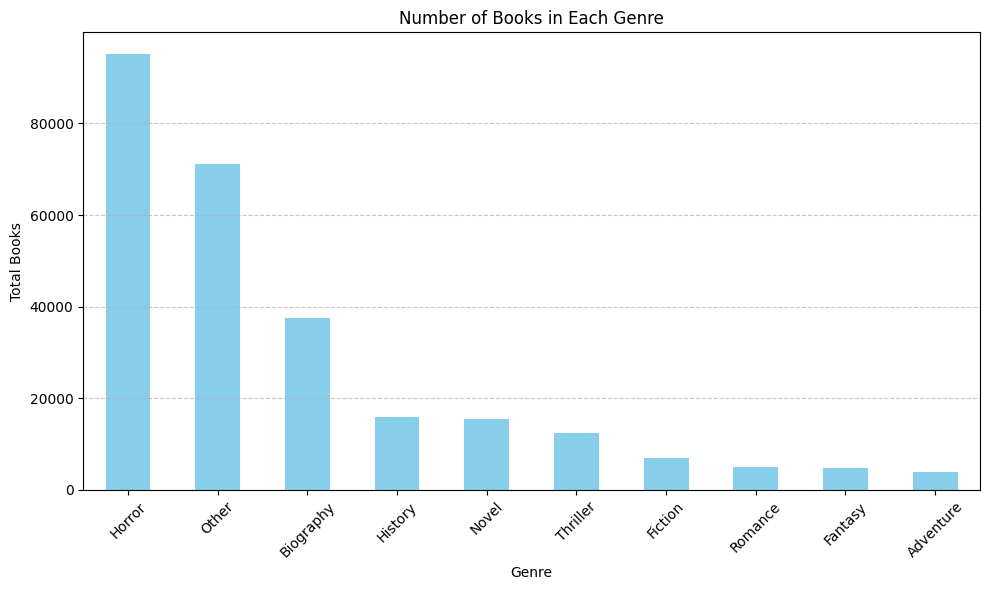

In [31]:
genre_counts = final_df['Genre'].value_counts()

# Plotting
plt.figure(figsize=(10, 6))
genre_counts.plot(kind='bar', color='skyblue')
plt.title('Number of Books in Each Genre')
plt.xlabel('Genre')
plt.ylabel('Total Books')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Conclusion

Word2Vec works by converting each word in a book title into a vector that has a mathematical representation. This means looking for similarities between the vector representation of book titles and the vector representation for each predetermined genre. The genre most similar to the vector representation of book titles, based on cosine similarity, is selected as the genre predictor.

Then based on the results of the graphic analysis, the genre with the most interest is Horror and Fiction.

Model Predict for Text Classification

Learning Curve Function

In [32]:
def plot_learning_curve(estimator, X_train, y_train, X_test, y_test, train_sizes=np.linspace(0.1, 1.0, 10), cv=5):
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X_train, y_train, train_sizes=train_sizes, cv=cv
    )

    train_scores_mean = np.mean(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)

    plt.figure()
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Testing score")
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    plt.title("Learning Curve")
    plt.legend(loc="best")
    plt.grid()
    plt.show()

Naive Bayes

In [33]:
X = final_df['Book-Title']
y = final_df['Genre']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# TF-IDF vectorization
vectorizer = TfidfVectorizer()
X_train_tfidf = vectorizer.fit_transform(X_train)
X_test_tfidf = vectorizer.transform(X_test)

# Initialize and train Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train_tfidf, y_train)

# Predictions
y_pred = nb_classifier.predict(X_test_tfidf)
# Calculate accuracy
print("Accuracy train:", accuracy_score(y_train, nb_classifier.predict(X_train_tfidf)))
print("Accuracy test:", accuracy_score(y_test, y_pred))

Accuracy train: 0.7807479656619575
Accuracy test: 0.7540662903135655


Hyperparameter Tuning

Random Search

In [34]:
# Define the parameter grid for Random Search
param_grid = {
    'alpha': uniform(0.01, 10)  # Uniform distribution for alpha
}

# Initialize the Naive Bayes classifier
nb_classifier = MultinomialNB()

# Perform Random Search
random_search = RandomizedSearchCV(nb_classifier, param_distributions=param_grid, n_iter=50, cv=5, scoring='accuracy', random_state=42)
random_search.fit(X_train_tfidf, y_train)

# Get the best hyperparameters
best_alpha = random_search.best_params_['alpha']

# Initialize and train Naive Bayes classifier with the best hyperparameters
best = MultinomialNB(alpha=best_alpha)
best.fit(X_train_tfidf, y_train)

# Predictions
y_pred = best.predict(X_test_tfidf)

print("\nNaive Bayes (after tuning with Random Search):")
print("Best Alpha:", best_alpha)
print("Accuracy train:", accuracy_score(y_train, best.predict(X_train_tfidf)))
print("Accuracy test:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))


Naive Bayes (after tuning with Random Search):
Best Alpha: 0.21584494295802448
Accuracy train: 0.8311324753480616
Accuracy test: 0.7941236748458257
              precision    recall  f1-score   support

   Adventure       0.97      0.49      0.66       765
   Biography       0.82      0.71      0.76      7492
     Fantasy       0.89      0.73      0.81       965
     Fiction       0.90      0.41      0.57      1386
     History       0.89      0.60      0.72      3196
      Horror       0.71      0.93      0.80     19028
       Novel       0.88      0.74      0.80      3097
       Other       0.87      0.80      0.84     14247
     Romance       0.88      0.60      0.72       992
    Thriller       0.88      0.70      0.78      2505

    accuracy                           0.79     53673
   macro avg       0.87      0.67      0.74     53673
weighted avg       0.81      0.79      0.79     53673



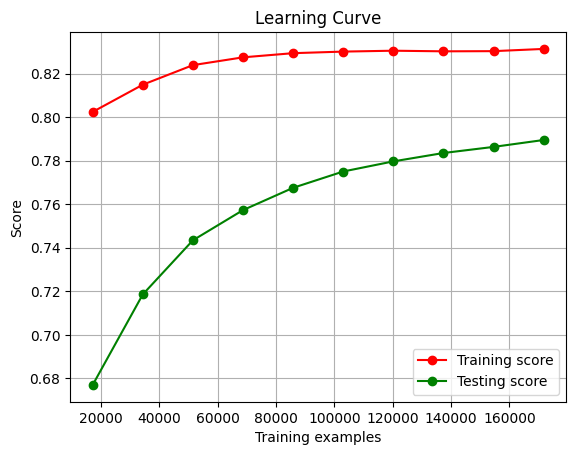

In [35]:
plot_learning_curve(best, X_train_tfidf, y_train, X_test_tfidf, y_test)

Optuna

In [36]:
def objective(trial):
    # Define search space for alpha parameter
    alpha = trial.suggest_loguniform('alpha', 0.05, 10)
    fit_prior = trial.suggest_categorical('fit_prior', [True, False])

    # TF-IDF vectorization
    vectorizer = TfidfVectorizer()
    X_train_tfidf = vectorizer.fit_transform(X_train)
    X_test_tfidf = vectorizer.transform(X_test)

    # Initialize Naive Bayes classifier with the suggested alpha value
    nb_classifier = MultinomialNB(alpha=alpha, fit_prior=fit_prior)

    # Compute cross-validation scores
    cv_scores = cross_val_score(nb_classifier, X_train_tfidf, y_train, cv=5)

    # Return the mean cross-validation score
    return cv_scores.mean()

# Optimize hyperparameters using Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=30)

# Get the best hyperparameters
best_alpha = study.best_params['alpha']
best_fit_prior = study.best_params['fit_prior']

# TF-IDF vectorization using best hyperparameters
vectorizer = TfidfVectorizer()
X_train_tfidf = vectorizer.fit_transform(X_train)
X_test_tfidf = vectorizer.transform(X_test)

# Train the Naive Bayes classifier with the best hyperparameters
best_nb_classifier = MultinomialNB(alpha=best_alpha, fit_prior=best_fit_prior)
best_nb_classifier.fit(X_train_tfidf, y_train)

# Predictions
y_pred = best_nb_classifier.predict(X_test_tfidf)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Test Accuracy:", accuracy)

[I 2024-03-27 15:34:58,065] A new study created in memory with name: no-name-b0a4ffbc-648f-464c-b3cd-d4977b7b9be5
[I 2024-03-27 15:35:05,352] Trial 0 finished with value: 0.7991606397605484 and parameters: {'alpha': 0.07270128037365027, 'fit_prior': True}. Best is trial 0 with value: 0.7991606397605484.
[I 2024-03-27 15:35:13,703] Trial 1 finished with value: 0.7690100547815992 and parameters: {'alpha': 0.4614826340264994, 'fit_prior': False}. Best is trial 0 with value: 0.7991606397605484.
[I 2024-03-27 15:35:27,663] Trial 2 finished with value: 0.772741034686294 and parameters: {'alpha': 0.6715712569956239, 'fit_prior': False}. Best is trial 0 with value: 0.7991606397605484.
[I 2024-03-27 15:35:48,855] Trial 3 finished with value: 0.651356144445264 and parameters: {'alpha': 4.914339187994151, 'fit_prior': True}. Best is trial 0 with value: 0.7991606397605484.
[I 2024-03-27 15:36:16,325] Trial 4 finished with value: 0.6286721746594269 and parameters: {'alpha': 6.906051938690746, 'fit_

Test Accuracy: 0.8083207571777243


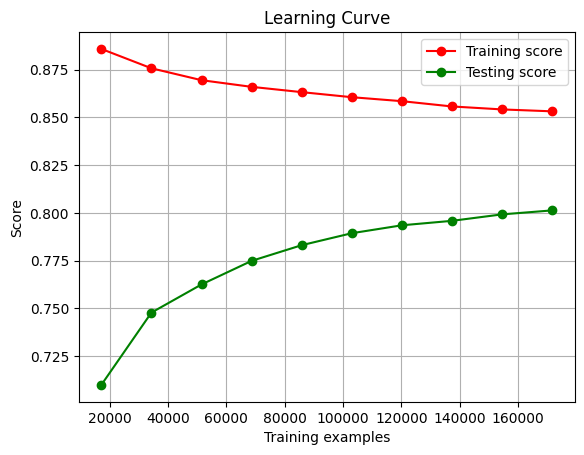

In [38]:
plot_learning_curve(best_nb_classifier, X_train_tfidf, y_train, X_test_tfidf, y_test)

The highest tuning parameter result value is Optuna so Optuna is used next.

Test prediction with unseen data

In [39]:
# Generate random string with length 10 consisting of uppercase letters and digits for ISBN
random_string = ''.join(random.choices(string.ascii_uppercase + string.digits, k=10))

new_data = {
    'ISBN': [random_string],
    'Book-Title': ['The Ocean Island'],
    'Book-Author': ['John Cena'],
    'Publisher': ['Kartanegara'],
    'Year-Of-Publication': ['2005'],
    'Image-URL-S': ['http://images.amazon.com/images/P/0002005018.01.THUMBZZZ.jpg'],
    'Image-URL-M': ['http://images.amazon.com/images/P/1552041778.01.THUMBZZZ.jpg'],
    'User-ID': [86],
    'Book-Rating': [9],
    'Age': [19]
    # Genre not available
}

# Vectorized text
new_data_features = vectorizer.transform(new_data['Book-Title'])

predicted_genre = best_nb_classifier.predict(new_data_features)

print("Predicted Genre:", predicted_genre)

Predicted Genre: ['Horror']


In [40]:
check = final_df[final_df['Book-Title'] == 'The Ocean Island']

In [41]:
# If data is not found, add new data to final_df dataframe
if check.empty:
    new_entry = pd.DataFrame(new_data)
    new_entry['Genre'] = predicted_genre
    final_df = pd.concat([final_df, new_entry], ignore_index=True)

In [42]:
check = final_df[final_df['Book-Title'] == 'The Ocean Island']
check

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,User-ID,Book-Rating,Age,Genre
268362,LE7760HO0O,The Ocean Island,John Cena,2005,Kartanegara,http://images.amazon.com/images/P/0002005018.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/1552041778.01.THUMBZZZ.jpg,86,9,19,Horror


In [43]:
final_df.sample(5)

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,User-ID,Book-Rating,Age,Genre
130022,031021923X,"Jesus I Never Knew, The",Philip Yancey,2002,Zondervan Publishing Company,http://images.amazon.com/images/P/031021923X.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/031021923X.01.MZZZZZZZ.jpg,185497,4,26,Horror
252974,0440772109,Ramona Forever (Ramona Quimby (Paperback)),Beverly Cleary,1985,Yearling Books,http://images.amazon.com/images/P/0440772109.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0440772109.01.MZZZZZZZ.jpg,62329,8,35,Other
197657,0671003755,She's Come Undone (Oprah's Book Club (Paperback)),Wally Lamb,1996,Washington Square Press,http://images.amazon.com/images/P/0671003755.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0671003755.01.MZZZZZZZ.jpg,53699,7,27,Fantasy
66,0345378490,Congo,Michael Crichton,1995,Ballantine Books,http://images.amazon.com/images/P/0345378490.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0345378490.01.MZZZZZZZ.jpg,11676,9,35,Other
28439,042517445X,Men Who Can't Love: How to Recognize a Commitmentphobic Man Before He Breaks Your Heart,Steven Carter,2000,Berkley Publishing Group,http://images.amazon.com/images/P/042517445X.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/042517445X.01.MZZZZZZZ.jpg,59971,5,27,Horror


Genre Distribution

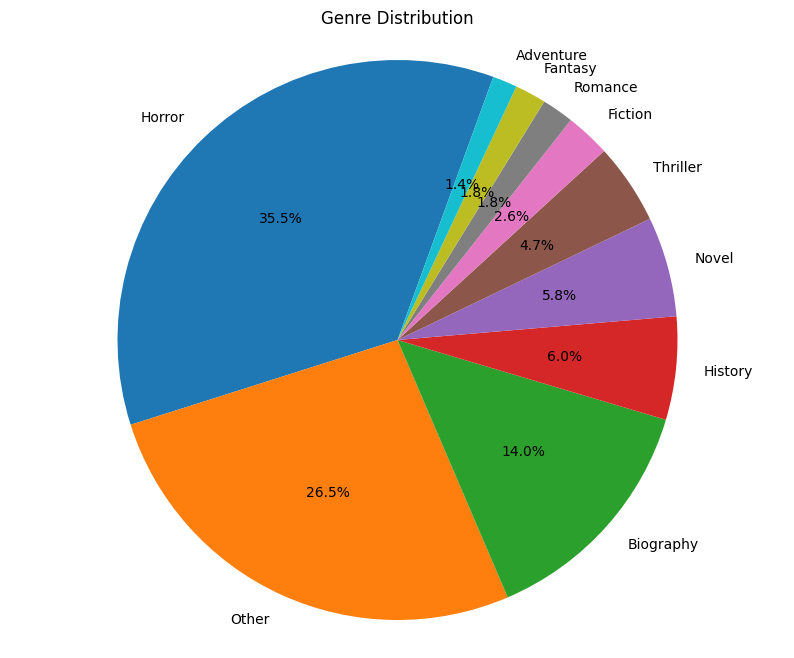

In [44]:
genre_counts = final_df['Genre'].value_counts()

# Pie chart
plt.figure(figsize=(10, 8))
plt.pie(genre_counts, labels=genre_counts.index, autopct='%1.1f%%', startangle=70)
plt.axis('equal')
plt.title('Genre Distribution')
plt.show()

In [45]:
genre_counts = final_df['Genre'].value_counts()
genre_counts

Horror       95141
Other        71236
Biography    37459
History      15980
Novel        15486
Thriller     12526
Fiction       6931
Romance       4957
Fantasy       4824
Adventure     3823
Name: Genre, dtype: int64

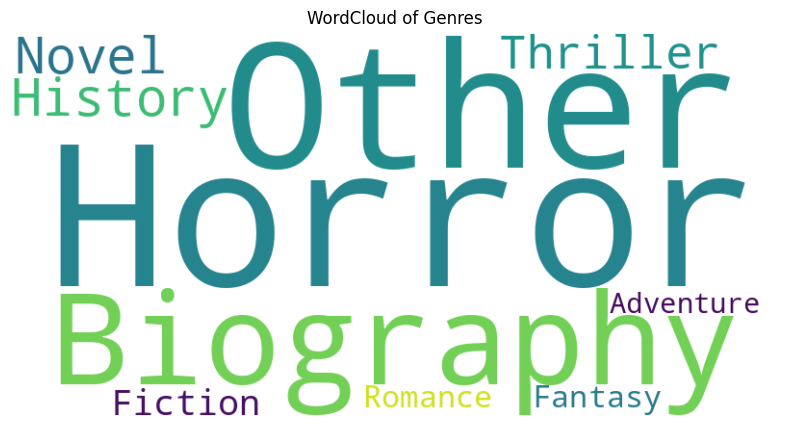

In [46]:
# WordCloud
wordcloud = WordCloud(width=800, height=400, background_color ='white', collocations=False).generate_from_frequencies(genre_counts)

# Show WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('WordCloud of Genres')
plt.show()

Recommendations

In [47]:
corpus = (final_df['Book-Title'] + ' ' + final_df['Genre']).apply(str.split).tolist()

In [48]:
word2vec_model_recommender = Word2Vec(sentences=corpus, vector_size=500, window=5, min_count=5, sg=2)

In [49]:
def get_recommendations(title, genre, data, word2vec_model):
    # Combine title and genre into one text
    text = title + ' ' + genre

    # Tokenize text
    tokens = text.split()

    # Get average vector for tokens
    vectors = [word2vec_model.wv[token] for token in tokens if token in word2vec_model.wv]
    if len(vectors) == 0:
        return None

    avg_vector = sum(vectors) / len(vectors)

    # Calculate cosine similarity with all other books
    similarities = []
    recommended_titles = set()  # Set to store titles of recommended books
    for idx, row in data.iterrows():
        other_vectors = [word2vec_model.wv[token] for token in row['Book-Title'].split() if token in word2vec_model.wv]
        if len(other_vectors) > 0:
            other_avg_vector = sum(other_vectors) / len(other_vectors)
            similarity = cosine_similarity([avg_vector], [other_avg_vector])[0][0]
            similarities.append((row, similarity))

    # Sort by similarity
    similarities.sort(key=lambda x: x[1], reverse=True)

    # Get top 10 unique recommendations
    recommendations = []
    for book, sim in similarities:
        if book['Book-Title'] not in recommended_titles and book['Book-Rating'] > 5:
            recommendations.append(book.to_dict())
            recommended_titles.add(book['Book-Title'])
        if len(recommendations) >= 10:
            break

    df_recommendations = pd.DataFrame(recommendations)

    return df_recommendations

In [50]:
recommendations = get_recommendations("Anglo-American Cataloguing Rules", "Fiction", final_df.sample(10000), word2vec_model_recommender)
recommendations

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,User-ID,Book-Rating,Age,Genre
0,0688170145,Virgin Fiction 2 (Virgin Fiction),Rob Weisbach Books,1999,Harpercollins,http://images.amazon.com/images/P/0688170145.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0688170145.01.MZZZZZZZ.jpg,60287,7,42,Fiction
1,0451459040,Redshift: Extreme Visions of Speculative Fiction,Al Sarrantonio,2002,Roc,http://images.amazon.com/images/P/0451459040.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0451459040.01.MZZZZZZZ.jpg,188379,10,51,Biography
2,0898799279,Characters and Viewpoint (Elements of Fiction Writing),Orson Scott Card,1999,Writer's Digest Books,http://images.amazon.com/images/P/0898799279.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0898799279.01.MZZZZZZZ.jpg,22885,9,30,Biography
3,0062720066,What If? Writing Exercises for Fiction Writers,Anne Bernays,1991,HarperResource,http://images.amazon.com/images/P/0062720066.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0062720066.01.MZZZZZZZ.jpg,190885,6,38,Horror
4,1880684578,Living on the Edge: Fiction by Peace Corps Writers,John Coyne,1999,Curbstone Press,http://images.amazon.com/images/P/1880684578.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/1880684578.01.MZZZZZZZ.jpg,52021,8,27,Horror
5,0140075623,Stones for Ibarra (Penguin Contemporary American Fiction Series),Harriet Doerr,1988,Penguin Books,http://images.amazon.com/images/P/0140075623.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0140075623.01.MZZZZZZZ.jpg,112811,9,53,Fiction
6,0142501425,Firebirds: An Anthology of Original Fantasy and Science Fiction,Diana Wynne Jones,2003,Firebird,http://images.amazon.com/images/P/0142501425.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0142501425.01.MZZZZZZZ.jpg,111578,10,35,Biography
7,0440218985,2041: Twelve Short Stories About the Future by Top Science Fiction Writers,Jane Yolen,1994,Laurel-Leaf Books,http://images.amazon.com/images/P/0440218985.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0440218985.01.MZZZZZZZ.jpg,55548,7,35,Horror
8,0786240776,"Goodbye Dear, I'll Be Back in a Year (Five Star First Edition Women's Fiction Series)",Patricia Abbott,2002,Five Star (ME),http://images.amazon.com/images/P/0786240776.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0786240776.01.MZZZZZZZ.jpg,98391,8,52,Fiction
9,0684853515,Hearts In Atlantis : New Fiction,Stephen King,1999,Scribner,http://images.amazon.com/images/P/0684853515.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0684853515.01.MZZZZZZZ.jpg,235282,6,43,History
